# Анализ рынка общественного питания Москвы

## Введение

### Описание данных

Для анализа мы получили датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- middle_avg_bill — число с оценкой среднего чека;
- middle_coffee_cup — число с оценкой одной чашки капучино;
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым;
- district — административный район, в котором находится заведение;
- seats — количество посадочных мест.

### Шаги исследования

1) Изучим общую информацию о датасете. 

2) Выполним предобработку данных (удалим дубликаты, приведем данные в нужный формат, обработаем пропуски, добавим нужные столбцы).

3) Проанализируем данные.

    - Изучим, какие категории заведений представлены в данных и количество объектов по категориям. Построим визуализации.
    - Исследуем количество посадочных мест в местах по категориям. Построим визуализации. 
    - Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Узнаем, каких заведений больше и какие категории заведений чаще являются сетевыми. Построим визуализации.
    - Найдем топ-15 популярных сетей в Москве. Построим визуализации.
    - Изучим, как заведения распределены по административным районам Москвы.
    - Изучим рейтинги заведений. 
    - Построим фоновую картограмму со средним рейтингом заведений каждого района. Отобразим все заведения датасета на карте.
    - Найдием топ-15 улиц по количеству заведений и улицы, на которых находится только один объект общепита. 
    - Изучим значения средних чеков заведений.
    - Соберем наблюдения по вопросам выше в один общий вывод.
    
4) Детализируем исследование для открытия кофейни. Ответим на следующие вопросы:

    - Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
    - Есть ли круглосуточные кофейни?
    - Какие у кофеен рейтинги? Как они распределяются по районам?
    - На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
    - Построим визуализации и дадим рекомендацию для открытия нового заведения. 
    
5) Подготовим PDF-презентацию исследования для инвесторов. 

### Цели исследования

Подготовить исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты инвесторам из фонда «Shut Up and Take My Money». Результаты исследования должны помочь в выборе подходящего инвесторам места для открытия кофейни.

Дать рекомендацию для открытия нового заведения, обосновать свою рекомендацию. 

## Общая информация о данных

In [1]:
# загрузим нужные для работы библиотеки

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
import folium
from folium import Map, Choropleth, Marker
import json
from folium.plugins import MarkerCluster
import warnings
warnings.filterwarnings('ignore')

In [2]:
# прочитаем и сохраним датасет, изучим общую информацию о нем

df = pd.read_csv(r"C:\Users\bonny\Desktop\мои_проекты_практикум\проект_9_общепит\moscow_places.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [3]:
# посмотрим на первые 5 строк таблицы
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


В датасете представлены 8406 заведений общепита Москвы. В таблице 14 столбцов, в 6 из них есть пропуски. Название заведения, его тип, адрес, район, в котором оно находится, часы работы, уровень цен и средняя стоимость заказа представлены в формате object; координаты заведения, его рейтинг, средний чек, стоимость чашки кофе и к-во посадочных мест - в формате вещественного числа; столбец chain хранит целое число (1 - если заведение сетевое, 0 - если несетевое).

##  Предобработка данных

In [4]:
# проверим, есть ли в таблице дубликаты

df.duplicated().sum()

0

In [5]:
# проверим, нет ли неявных дубликатов. для этого создадим таблицу с названием и адресом

name_address = df[['name','address']]

In [6]:
name_address.duplicated().sum()

0

Дубликатов нет.

In [7]:
# посчитаем долю пропусков по столбцам

df.isna().mean()

name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.063764
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.605639
avg_bill             0.546039
middle_avg_bill      0.625387
middle_coffee_cup    0.936355
chain                0.000000
seats                0.429574
dtype: float64

В столбце с часами работы 6% пропусков, в столбце с к-вом посадочных мест - почти 43%. Заполнить эти пропуски мы не можем - эти данные могут отличаться от кафе к кафе даже в рамках одной сети. Лучше у нас будут неполные данные, зато точные. 

В столбце с категориями цен 60% пропусков, со средней стоимостью заказа в виде диапазона - почти 55%. Это очень много, но работать с этими столбцами отдельно мы не будем и пропуски эти тоже не будем трогать.

При анализе цен заведений мы будем использовать столбцы со средним чеком (62% пропусков) и ценой чашки капучино (93% пропусков). Доля пропусков здесь очень большая, но заполнить их достоверно не получится, поэтому оставим их как есть.

In [8]:
# создадим столбец street с названиями улиц из столбца с адресом. Для этого напишем функцию

def street (x):  
      return  x.split(',')[1].strip()            

In [9]:
df['street'] = df['address'].apply(street)

In [10]:
# создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно

def hours24_7 (h):
    if h == "ежедневно, круглосуточно":
        return True
    
    else:
        return False 

In [11]:
df['is_24/7'] = df['hours'].apply(hours24_7)

Мы получили для анализа датасет с 8406 строками (заведениями общепита Москвы) и 14 столбцами, в 6 из них есть пропуски. 

В столбце с часами работы 6% пропусков, в столбце с к-вом посадочных мест - почти 43%, с категориями цен - 60%, со средней стоимостью заказа в виде диапазона - почти 55%, со средним чеком - 62% и ценой чашки капучино - 93%. Хоть доля пропусков в некоторых столбцах очень большая, заполнить их достоверно мы не могли - эти данные могут отличаться от заведения к заведению даже в рамках одной сети. Мы оставили пропуски как есть. 

Удалять строки с пропущенными данными мы также не стали - мы потеряли бы очень много данных.

Мы проверили датасет на наличие явных и неявных дубликатов и не нашли их.

Мы закончили предобработку данных и можем приступать к анализу.

## Анализ данных

###  Категории заведений

In [12]:
# посчитаем, сколько заведений принадлежит к каждой категории

categories = df.groupby('category', as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False)
categories

,category,name
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [13]:
fig = go.Figure(data=[go.Pie(labels=categories['category'], values=categories['name'])])
fig.update_layout(title='Доли каждой категории заведений')
fig.show() 

Как мы видим, три самых популярных типа заведений - это кафе (2378 кафе, или 28,3% от всех заведений), ресторан	(2043 ресторанов, 24,3% от всех заведений) и кофейня (1413 кофейни, 16,8% от всех заведений). 

Меньше всего булочных (256, 3%) и столовых (315, 3,75%).

###  Количество посадочных мест

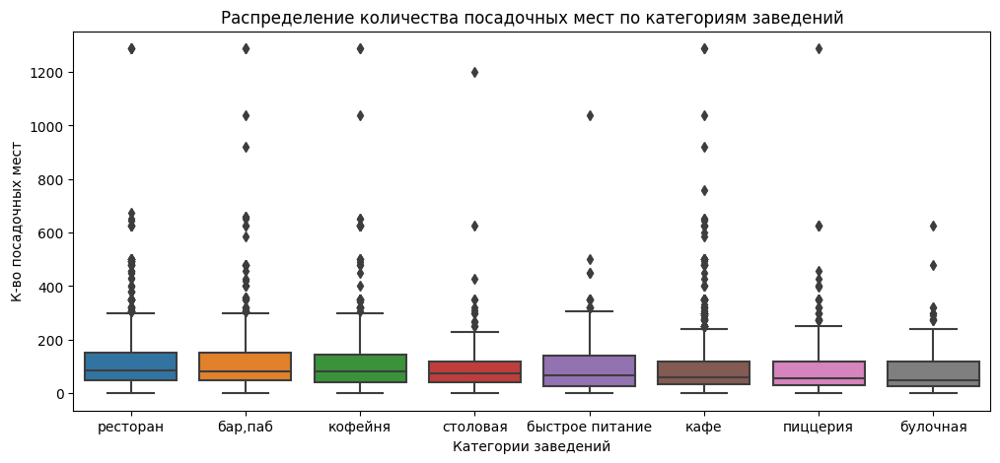

In [14]:
# для начала посмотрим, как распределены значения столбца seats по категориям

my_order = df.groupby(by=["category"]).agg({"seats":'median'}).sort_values(by='seats', ascending=False).index

plt.figure(figsize=(12, 5))
ax = sns.boxplot(x='category', y='seats', data=df, order=my_order) 
ax.set(xlabel='Категории заведений', ylabel='К-во посадочных мест')
plt.title("Распределение количества посадочных мест по категориям заведений")
plt.show()

Как мы видим, в каждой категории есть выбросы, которые исказят расчеты, если мы возьмем среднее значение. Поэтому для сводной таблицы мы воспользуемся медианой.

In [15]:
# посмотрим на медианное значение к-ва посадочных мест в зависимости от типа заведения

seats = df.groupby('category', as_index=False).agg({'seats':'median'}).sort_values(by='seats', ascending=False)
seats

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


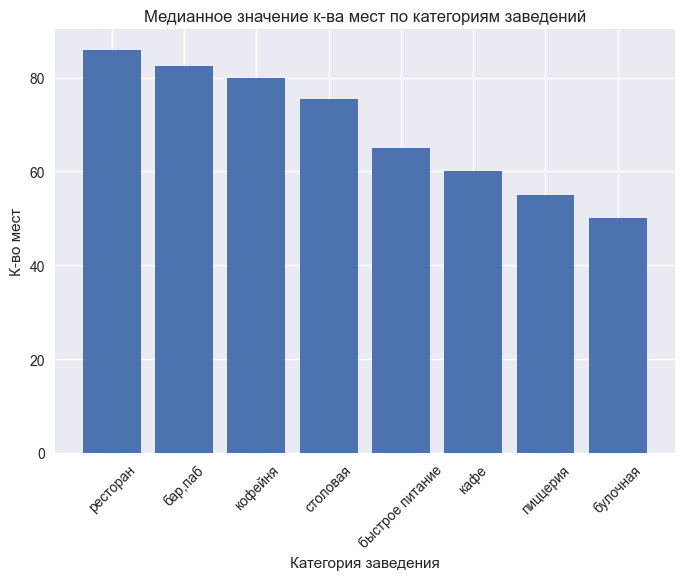

In [16]:
with plt.style.context('seaborn'):
    plt.bar(seats['category'],seats['seats'])
    plt.xlabel("Категория заведения")
    plt.ylabel("К-во мест")
    plt.title('Медианное значение к-ва мест по категориям заведений')
    plt.xticks(rotation=45)
    plt.show()

Как мы видим из таблицы и графика, больше всего посадочных мест - в ресторанах, затем в барах/пабах и в кофейнях. Меньше всего - в булочных.

### Сетевые и несетевые заведения

In [17]:
# отобразим доли сетевых и несетевых заведений

chain_or_not = df.groupby('chain', as_index=False).agg({'name':'count'})

fig = go.Figure(data=[go.Pie(labels=chain_or_not['chain'], values=chain_or_not['name'])]) 
fig.update_layout(title='Соотношение сетевых заведений к несетевым')
fig.update_traces(labels=['несетевые', 'сетевые'])
fig.show() 

Как показывает график, несетевых заведений в Москве гораздо больше, чем сетевых. 

Соотношение сетевых заведений к несетевым: 38,1% к 61,9%.

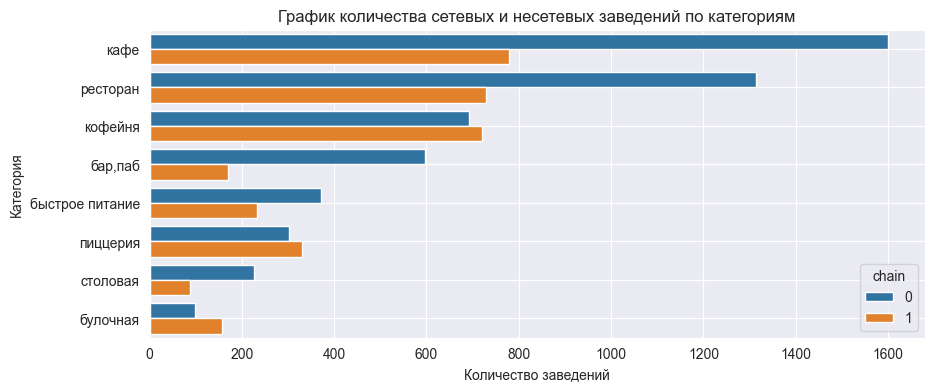

In [18]:
# посмотрим, какие категории заведений чаще являются сетевыми

# группируем данные 
data_ed = df.groupby(['category', 'chain'], as_index = False)[['name']].count().sort_values(by='name', ascending=False)
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(10, 4))
# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='category', data=data_ed, hue='chain')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График количества сетевых и несетевых заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категория')
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

На этом графике видно, что больше всего сетевых заведений среди кафе, ресторанов и кофеен, но это потому, что это в принципе самые большие категории. Если же смотреть на соотношение сетевых/несетевых заведений внутри категорий, то сетевых больше среди кофеен, пиццерий и булочных.

Построим график долей сетевых заведений по категориям.

In [19]:
# создадим таблицу с долями сетевых заведений по категориям

total = df.groupby('category', as_index = False)[['name']].count()
chain = df.query('chain==1').groupby('category', as_index = False)[['name']].count()
chain_share = total.merge(chain, on='category', how='left')
chain_share['share'] = round(chain_share['name_y']/chain_share['name_x']*100)

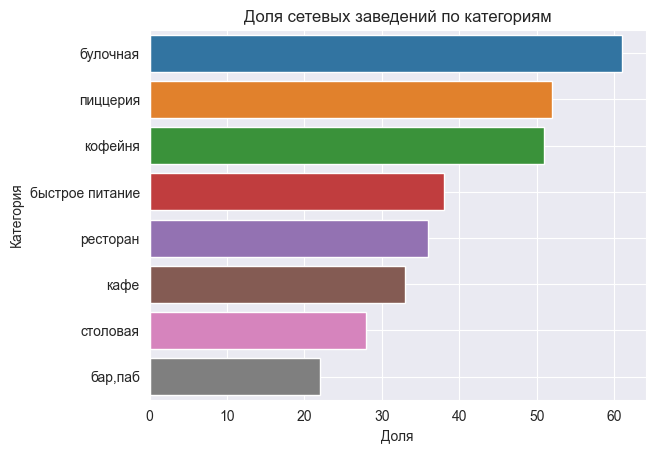

In [20]:
sns.set_style('dark')
sns.barplot(x='share', y='category', data=chain_share.sort_values(by='share', ascending=False))
plt.title('Доля сетевых заведений по категориям')
plt.xlabel('Доля')
plt.ylabel('Категория')
plt.grid()
plt.show()

Как показывает график, доля сетевых заведений больше всего среди булочных (61%), пиццерий (52%) и кофеен (51%).

### Топ-15 сетей

In [21]:
# найдем 15 самых крупных сетей в Москве

df['name2'] = df['name'] 

top15 = df.groupby('name', as_index=False).agg({'name2':'count'}).sort_values(by='name2', ascending=False)
top15.head(15)

,name,name2
2890,Кафе,189
5522,Шоколадница,120
2584,Домино'с Пицца,76
2551,Додо Пицца,74
1156,One Price Coffee,71
5595,Яндекс Лавка,69
419,Cofix,65
1290,Prime,50
5083,Хинкальная,44
5421,Шаурма,43


Как мы видим, в список 15 самых крупных сетей попали такие названия как «Кафе», «Шаурма», «Хинкальная», «Чайхана» и «Ресторан» - совершенно необязательно все заведения с одним названиям принадлежат одной сети - название слишком общее и может использоваться совершенно разными владельцами. 

Кроме того, в список попала «Яндекс.Лавка» - а это вообще служба доставки продуктов.

Уберем эти названия, чтобы получить топ-15 настоящих сетей.

In [22]:
false_names = ['Кафе', 'Шаурма', 'Хинкальная', 'Чайхана', 'Ресторан', 'Яндекс.Лавка']

top15 = top15.query('name not in @false_names')

top15.head(15)

,name,name2
5522,Шоколадница,120
2584,Домино'с Пицца,76
2551,Додо Пицца,74
1156,One Price Coffee,71
5595,Яндекс Лавка,69
419,Cofix,65
1290,Prime,50
2825,КОФЕПОРТ,42
3302,Кулинарная лавка братьев Караваевых,39
4788,Теремок,38


Уже лучше, но теперь нам попалась «Столовая» и другое написание «Яндекс Лавки». Почистим список еще.

In [23]:
false_names = ['Кафе', 'Шаурма', 'Хинкальная', 'Чайхана', 'Ресторан', 'Яндекс.Лавка', 'Яндекс Лавка','Столовая']

top15 = top15.query('name not in @false_names')

top15.head(15)

,name,name2
5522,Шоколадница,120
2584,Домино'с Пицца,76
2551,Додо Пицца,74
1156,One Price Coffee,71
419,Cofix,65
1290,Prime,50
2825,КОФЕПОРТ,42
3302,Кулинарная лавка братьев Караваевых,39
4788,Теремок,38
349,CofeFest,32


In [24]:
# Теперь у нас точно список 15 сетей. Оформим его в датасет и построим диаграмму

top_chains = top15.head(15)

fig = px.bar(top_chains, 
             x='name2', 
             y='name', 
             text='name2' 
            )                  
fig.update_layout(title='ТОП-15 сетей по количеству заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название сети')
fig.show() 

Как мы видим, самая крупная сеть - «Шоколадница», кофейня. А в топ-5 самых крупных сетей три кофейни и две пиццерии.

In [25]:
top_15_list = top_chains['name'].tolist()
top_15_df = df.query('name in @top_15_list')

In [26]:
# посмотрим, как сетевые заведения распределены по округам Москвы

top_by_district = top_15_df.groupby(['district','category'], as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False)

In [27]:
fig = px.bar(top_by_district, x='district', y='name', color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Топ-15 сетей по округам',
                   xaxis_title='Название округа',
                   yaxis_title='Количество заведений')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

Как показывает график, в ЦАО примерно в 2 раза больше заведений, чем в любом другом округе. Меньше всего заведений - в СЗАО. 

В ЦАО самые крупные категории - кофейня, ресторан, кафе. В остальных округах также больше всего сетевых кофеен, но на втором месте - пиццерии.

### Административные округа

In [28]:
# посмотрим, сколько заведений находится в каждом округе

df['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [29]:
by_district = df.groupby(['district','category'], as_index=False).agg({'name':'count'})

In [30]:
fig = px.bar(by_district, x='district', y='name', color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Распределение заведений по округам',
                   xaxis_title='Название округа',
                   yaxis_title='Количество заведений')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

Как и в случае с сетевыми заведениями, в ЦАО примерно в 2 раза больше заведений, чем в любом другом округе. Меньше всего заведений - в СЗАО.

Самыми популярными типами заведений также остаются ресторан, кафе и кофейня. Интересно, что в ЦАО очень большая доля баров, в то время как в других округах их совсем мало.

Доля пиццерий и кафе быстрого питания во всех округах примерно одинакова.

### Средний рейтинг по категориям

In [31]:
# найдем средний рейтинг для каждого типа заведения

rating_by_category = df.groupby('category', as_index=False).agg({'rating':'mean'}).sort_values(by='rating', ascending=False)

rating_by_category

,category,rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


In [32]:
fig = px.bar(rating_by_category, x='category', y='rating')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Средний рейтинг заведений по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Средний рейтинг',
                  yaxis_range=[4,4.4]
                                   )

fig.show()

Как мы видим, средний рейтинг заведения практически не различается от категории к категории. 

Самый высокий средний рейтинг у баров, самый низкий - у фастфуда, но разница между ними 0,33 балла.

### Средний рейтинг по районам

In [33]:
# создадим таблицу с рейтингами по округам

rating_by_district = df.groupby('district', as_index=False).agg({'rating':'mean'}).sort_values(by='rating', ascending=False)
rating_by_district

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


Самый высокий средний рейтинг - у заведений в ЦАО, самый низкий - в ЮВАО, но разница между ними небольшая - 0,27 балла.

### Карта заведений Москвы

In [35]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### Tоп-15 улиц по количеству заведений

In [36]:
# найдем 15 улиц с наибольшим к-вом заведений

df['street'].value_counts().head(15)

проспект Мира             184
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: street, dtype: int64

In [37]:
top_streets = df.groupby('street', as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False).head(15).reset_index()
top_streets_list = top_streets['street'].tolist()
by_street = df.query('street in @top_streets_list').groupby(['street','category'], as_index=False).agg({'name':'count'})

In [38]:
# проверим, в каких округах расположены эти улицы

df.query('street in @top_streets_list').groupby('district').agg({'street':'nunique'}).sort_values(by='street', ascending=False)

,street
district,
Юго-Западный административный округ,6
Южный административный округ,5
Западный административный округ,4
Северный административный округ,4
Северо-Восточный административный округ,3
Центральный административный округ,3
Юго-Восточный административный округ,2
Восточный административный округ,1
Северо-Западный административный округ,1


Интересно, что больше всего таких улиц находятся в ЮЗАО. Можно было бы предположить, что их больше в ЦАО, где в принципе больше всего заведений, но в ЦАО только 3 таких улицы.

Значит, в центре заведения не расположены так скученно, как в некоторых окраинных округах.

In [39]:
fig = px.bar(by_street, x='street', y='name', color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Распределение заведений на 15 самых популярных улицах',
                   xaxis_title='Название улицы',
                   yaxis_title='Количество заведений')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

Лидер по количеству заведений - улица Мира (ЗАО).

Самые популярные категории заведений на большинстве улиц - кафе, ресторан и кофейня, однако, распределение неравномерно. Например, на проспекте Мира большая доля фастфуда, которого почти нет на Ленинском и Ленинградском проспекте. На Ленинском проспекте много баров, но их пости нет на МКАДе.

### Улицы с одним заведением

In [40]:
street_grouped = df.groupby('street', as_index=False).agg({'name':'count'})

unpop_streets_list = street_grouped.query('name==1')['street'].tolist()

unpop_streets = df.query('street in @unpop_streets_list')

In [41]:
# посмотрим, сколько улиц с одним заведением находятся в каждом округе

unpop_streets['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Северный административный округ             52
Восточный административный округ            52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

In [42]:
# и к какой ценовой категории относятся эти заведения

unpop_streets['price'].value_counts()

средние          120
выше среднего     29
высокие           22
низкие            11
Name: price, dtype: int64

In [43]:
# и какие категории заведений там находятся

unpop_streets['category'].value_counts()

кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

In [44]:
# и наконец, сетевые они или нет

unpop_streets['chain'].value_counts()

0    325
1    133
Name: chain, dtype: int64

Больше всего улиц с одним заведением в ЦАО (145), меньше всего в ЮЗАО (18).

Большинство заведений - со средним уровнем цен. Больше всего кафе, меньше всего булочных.

Несетевых заведений в 2 с лишним раза больше, чем сетевых.

### Средний чек по округам

In [45]:
bill_by_district = df.groupby('district', as_index=False).agg({'middle_avg_bill':'median'}).sort_values(by='middle_avg_bill', ascending=False)

bill_by_district

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Дороже всего поход в заведение обойдется в ЦАО и ЗАО (1000 рублей средний чек), на втором месте СЗАО (700 рублей). На третьем САО (650 рублей). Самый низкий средний чек - в ЮВАО (450 рублей).

### Промежуточный вывод

Мы изучили датасет с 8406 заведеними общепита Москвы и сделали несколько выводов. 

Три самых популярных типа заведений - это кафе (2378 кафе, или 28,3% от всех заведений), ресторан (2043 ресторанов, 24,3% от всех заведений) и кофейня (1413 кофейни, 16,8% от всех заведений). Меньше всего булочных (256, 3%) и столовых (315, 3,75%).

Больше всего посадочных мест - в ресторанах, затем в барах/пабах и в кофейнях. Меньше всего - в булочных.

Соотношение сетевых заведений к несетевым - 38% к 62%. Доля сетевых заведений выше всего среди булочных (61%), пиццерий (52%) и кофеен (51%).

В список 15 самых крупных сетей попали пиццерии «Домино'с Пицца» и «Додо Пицца», кофейни «Шоколадница» (самая крупная сеть), «One Price Coffee», «Cofix», «CofeFest», «Кофемания» и «КОФЕПОРТ», блинная «Теремок», булочные «Буханка» и «Кулинарная лавка братьев Караваевых», кафе «Prime», «Му-Му» и «Drive Café» и ресторан «АндерСон».	

Большинство сетей из топ-15 принадлежит к средней ценовой категории.

В ЦАО примерно в 2 раза больше заведений, чем в любом другом округе. Меньше всего заведений - в СЗАО. Почти во всех округах самые крупные категории заведений - кофейня, кафе и ресторан. 

В ЦАО очень большая доля баров, в то время как в других округах их совсем мало.
Доля пиццерий и кафе быстрого питания во всех округах примерно одинакова.

Средний рейтинг заведения практически не различается ни по категориям (самый высокий средний рейтинг у баров, самый низкий - у фастфуда, но разница между ними 0,33 балла), ни по округам
(самый высокий средний рейтинг - у заведений в ЦАО, самый низкий - в ЮВАО, но разница между ними небольшая - 0,27 балла). 

Мы нашли топ-15 улиц, на которых больше всего заведений. Лидер по количеству заведений - улица Мира (ЗАО). Больше всего таких улиц находятся в ЮЗАО, а не в ЦАО, как можно было бы предположить, ведь там в принципе больше всего заведений, но в ЦАО только 3 таких улицы.
Значит, в центре заведения не расположены так скученно, как в некоторых окраинных округах.
Самыми популярными категориями заведений на этих улицах остаются кафе, ресторан и кофейня.

Больше всего улиц с одним заведением в ЦАО (145), меньше всего в ЮЗАО (18).
Большинство заведений - со средним уровнем цен. Больше всего кафе, меньше всего булочных.
Несетевых заведений в 2 с лишним раза больше, чем сетевых.

Дороже всего поход в заведение обойдется в ЦАО и ЗАО (1000 рублей средний чек), на втором месте СЗАО (700 рублей). На третьем САО (650 рублей). Самый низкий средний чек - в ЮВАО (450 рублей).

## Исследование рынка кофеен

In [47]:
# посмотрим, сколько кофеен в датасете

coffee_df = df.query('category == "кофейня"')

coffee_df['name'].count()

1413

Всего в датасете 1413 кофеен. Посмотрим, в каких округах они расположены.

In [48]:
# создадим датафрейм с к-вом кофеен в каждом округе

coffee_by_district = coffee_df.pivot_table(index='district', values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index()
coffee_by_district

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [49]:
fig = px.bar(coffee_by_district, x='district', y='name')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Количество кофеен по округам',
                   xaxis_title='Округ',
                   yaxis_title='К-во кофеен')
fig.show()

Как мы видим, с большим отрывом лидирует ЦАО (428 кофеен) - там больше, чем в 2 раза больше кофеен, чем в САО (193), который идет на втором месте.

Меньше всего кофеен в СЗАО (62).

In [50]:
# отобразим все кофейни на карте Москвы

coffee_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(coffee_map)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee_df.apply(create_clusters, axis=1)

coffee_map

In [51]:
# проверим, есть ли среди кофеен сетевые

display(coffee_df.groupby('is_24/7').agg({'name':'count'}))

,name
is_24/7,
False,1354
True,59


В датасете 59 сетевых кофеен и 1354 несетевых.

In [52]:
# посмотрим на средний рейтинг кофеен по округам

coffee_rating = coffee_df.groupby('district', as_index=False).agg({'rating':'mean'}).sort_values(by='rating', ascending=False)

coffee_rating

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [53]:
fig = px.bar(coffee_rating, x='district', y='rating')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Средний рейтинг кофеен по округам',
                   xaxis_title='Округ',
                   yaxis_title='Средний рейтинг',
                 yaxis_range=[4.1,4.4]
                 )
fig.show()

Как видно на графике, средний рейтинг кофеен между округами практически не отличается.

Самый высокий средний рейтинг у кофеен ЦАО, самый низкий - ЗАО, но между ними всего 0,14 балла разницы.

In [54]:
# изучим цены на чашку кофе

coffee_df['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [55]:
# удалим явный выброс, чтобы график получился нагляднее

coffee_df= coffee_df.loc[coffee_df['middle_coffee_cup']!=1568] 

In [56]:
coffee_df['middle_coffee_cup'].describe()

count    520.000000
mean     172.376923
std       65.767854
min       60.000000
25%      124.000000
50%      169.500000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

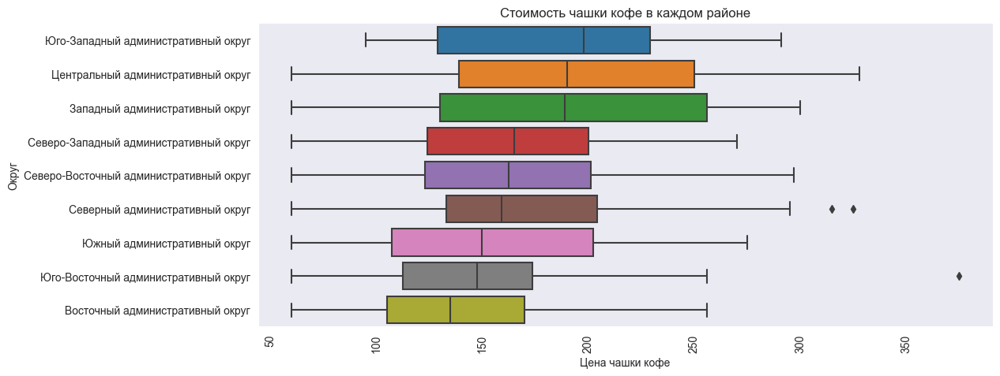

In [57]:
my_order2 = coffee_df.groupby(by=["district"]).agg({"middle_coffee_cup":'median'}).sort_values(by='middle_coffee_cup', ascending=False).index

plt.figure(figsize=(12, 5))
ax = sns.boxplot(x='middle_coffee_cup', y='district', data=coffee_df, order=my_order2) 
ax.set(xlabel='Цена чашки кофе', ylabel='Округ')
plt.title('Стоимость чашки кофе в каждом районе')
plt.xticks(rotation=90)
plt.show()

Как мы видим на графике размаха, дешевле всего выпить кофе можно в ЦАО (за 60 рублей), дороже всего - в ЮВАО (за 375 рублей).

В среднем же цена чашки капучино колеблется в районе 150–200 рублей во всех округах.

In [58]:
# посчитаем медианную цену чашки кофе по округам

median_price_cup = coffee_df.groupby('district', as_index=False).agg({'middle_coffee_cup':'median'}).sort_values(by='middle_coffee_cup', ascending=False)
median_price_cup

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [59]:
fig = px.bar(median_price_cup, x='district', y='middle_coffee_cup')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Медианная цена чашки кофе по округам',
                   xaxis_title='Округ',
                   yaxis_title='Медианная цена',
                  yaxis_range=[120,205]
                 )
fig.show()

Как мы видим, дороже всего кофе стоит в ЮЗАО: медианная цена 198 рублей. В ЦАО и ЗАО цена почти одинакова - 190 рублей. 

Самая низкая медианная цена капучино в ВАО - 135 рублей.

### Вывод и рекомендации

Мы проанализировали датасет и обнаружили следующее.

Всего в датасете 1413 кофеен, из них 59 сетевых и 1354 несетевых.

По числу кофеен с большим отрывом лидирует ЦАО (428), на втором месте САО (193).
Меньше всего кофеен в СЗАО (62).

Положительные оценки кофеен преобладают во всех округах. Однако в некоторых округах, например, СЗАО и ЮЗАО, разброс оценок небольшой - оценки начинаются примерно от 3,5 и выше. А в других округах разброс больше, например, в САО и СВАО.

Средний рейтинг кофеен между округами практически не отличается. Самый высокий средний рейтинг у кофеен ЦАО, самый низкий - ЗАО, но между ними всего 0,14 балла разницы.

Дешевле всего выпить кофе можно в ЦАО (за 60 рублей), дороже всего - в ЮВАО (за 375 рублей).
В среднем же цена чашки капучино колеблется в районе 150–200 рублей во всех округах.

Дороже всего кофе стоит в ЮЗАО: медианная цена 198 рублей. В ЦАО и ЗАО цена почти одинакова - 190 рублей. Самая низкая медианная цена капучино в ВАО - 135 рублей.

Основатели фонда «Shut Up and Take My Money» хотят открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве, и просят дать рекомендацию по ее открытию.

Оговоримся, что порекомендовать место для открытия кофейни на основании данных, которыми мы располагаем, сложно. Для начала хорошо было бы проанализировать объявления об аренде и данные о проходимости разных мест, чтобы рекомендовать что-то конкретное. Сейчас же мы можем дать лишь общие рекомендации.

Если за основу концепции кафе взять «Central Perk», то, как мы это понимаем, это должна быть несетевая кофейня, относительно демократичная, рассчитанная скорее на «местных», постоянных клиентов, а не, скажем, студентов или туристов. 

Такую кофейню не стоит открывать рядом с университетом или бизнес-центром, потому что студенты или офисные сотрудники скорее заходят взять кофе с собой во время обеденного перерыва - то есть это предполагает большой наплыв людей один-два раза в день, и мало кто из них будет сидеть в кафе долго. 

Также не стоит открываться вблизи самых популярных достопримечательностей, условно, рядом с Красной площадью, если заказчики не хотят, чтобы большинство клиентов были туристы, которые зайдут в кафе один раз. 

При этом «Central Perk» находился в центре Манхеттена, а не в тихом районе. Поэтому, чтобы попробовать максимально сохранить его «вайб», мы рекомендуем открыть кофейню на периферии Центрального административного округа, например, в Хамовниках или Замоскворечье. В частности, в Хамовниках довольно мало кофеен по сравнению с другими районами ЦАО (как можно увидеть на карте выше), и большинство из них - сетевые. 

Как мы видим на графике выше, кофе в ЦАО - среди самых дорогих по городу. В среднем капучино стоит 200 рублей, но есть и цены в 300 и даже больше рублей. Считаем, что при открытии кофейни можно ориентироватья на 200-250 рублей за чашку. 

Презентация исследования в формате PDF доспупна по ссылке: https://disk.yandex.ru/d/ug0xZ7j6s-2Bpg